# Image Stitching using SIFT

## Initialization

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import wget
from skimage.transform import warp
import scipy
import cv2
from matplotlib.patches import ConnectionPatch
from PIL import Image

In [69]:
def imshow_row(imttllist, axs=False):
    n = len(imttllist)
    for i, imttl in enumerate(imttllist):
        if imttl is None:
            continue
        im, ttl = imttl
        plt.subplot(1,n,i+1)
        plt.imshow(im, cmap='gray')
        if not axs:
            plt.axis('off')
        plt.title(ttl)
        
def draw_keypoints(kps, nkps=None, ax=None, marker='x', 
                   marker_size=10, scale_and_orientation=True):
    if ax is None:
        ax = plt.gca()
    if nkps is None:
        nkps = len(kps)
    xs = [kp.pt[0] for kp in kps]
    ys = [kp.pt[1] for kp in kps]
    ax.scatter(xs, ys, marker=marker)
    if scale_and_orientation:
        for kp in kps[:nkps]:
            x, y = kp.pt
            r = kp.size / 2
            angle = kp.angle/2/np.pi
            ax.add_artist(plt.Circle((kp.pt), kp.size/2, 
                                     color='green', fill=False))
            ax.add_artist(plt.Arrow(x, y, r*np.cos(angle), 
                                    r*np.sin(angle), color='red'))
            


def draw_matches(f1, kps1, f2, kps2, matches, 
                 horizontal=True, figsize=(15,15)):
    if horizontal:
        fig, axs = plt.subplots(1,2, figsize=figsize)
    else:
        fig, axs = plt.subplots(2,1, figsize=figsize)
    
    axs[0].imshow(f1)
    axs[1].imshow(f2)
    
    # get the indexes of the matches
    idx1 = [m.queryIdx for m in matches]
    idx2 = [m.trainIdx for m in matches]
    
    xs1 = [kps1[i].pt[0] for i in idx1]
    ys1 = [kps1[i].pt[1] for i in idx1]
    xs2 = [kps2[i].pt[0] for i in idx2]
    ys2 = [kps2[i].pt[1] for i in idx2]
    
    
    for x1, y1, x2, y2 in zip(xs1, ys1, xs2, ys2):
        con = ConnectionPatch(xyA=(x1, y1), xyB=(x2, y2), coordsA="data", coordsB="data",
                      axesA=axs[0], axesB=axs[1], color='g')
        axs[1].add_artist(con)            


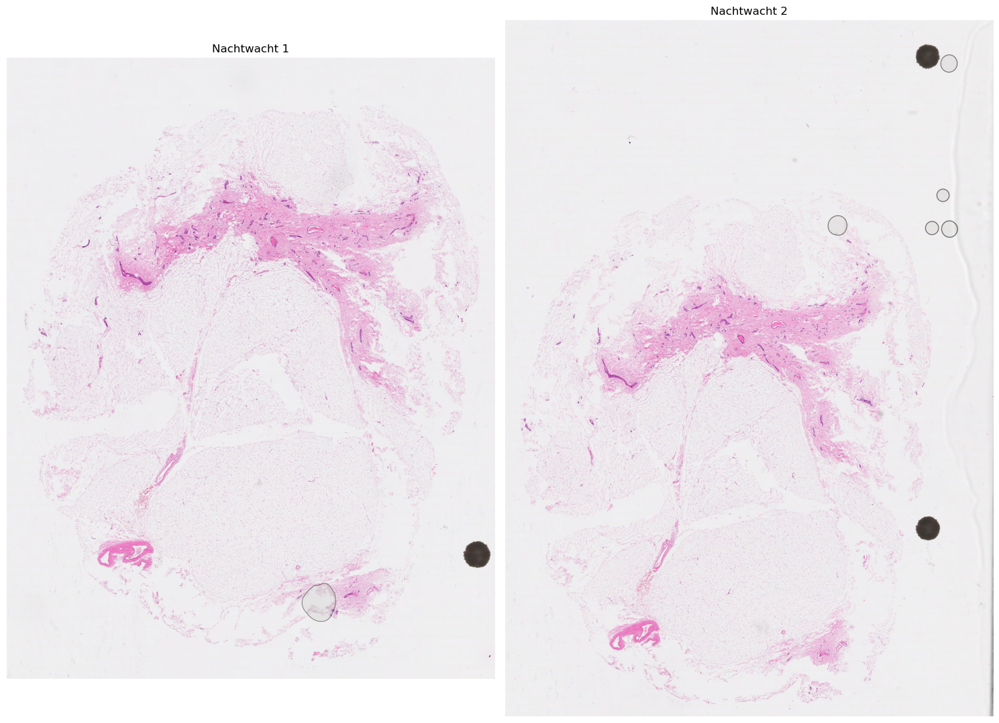

In [70]:
f1 = plt.imread('H21-066.1_HE331_0005_Scan1.qptiff - resolution #1.jpg')
f2 = plt.imread('H21-066.1_HE331_0009_Scan1.qptiff - resolution #1.jpg')

plt.figure(figsize=(15,15))
imshow_row([(f1, "Nachtwacht 1"),
            (f2, "Nachtwacht 2")])
plt.tight_layout()

In [71]:
def projective_transform_matrix(x1, x2, x3, x4, xa1, xa2, xa3, xa4):
    M = np.empty((0,9))
    for (x, y), (xa, ya) in zip([x1, x2, x3, x4], [xa1, xa2, xa3, xa4]):
        M = np.append(M, 
                      np.array([[x, y, 1, 0, 0, 0, -xa*x, -xa*y, -xa],
                                [0, 0, 0, x, y, 1, -ya*x, -ya*y, -ya]]),
                      axis=0)
    _, _, VT = np.linalg.svd(M)
    p = VT[-1]
    P = p.reshape((3,3))
    return P

def e2h(x):
    if len(x.shape) == 1:
        return np.hstack((x, [1]))
    return np.vstack((x, np.ones(x.shape[1])))
    
def h2e(tx):
    return tx[:-1]/tx[-1]


In [72]:
def projective_fit_model(data):
    """
    data is an iterable of pairs (input, output). Each pair consists of two Euclidean 2d vectors.
    
    Calculate the projection matrix P that maps all input points onto their corresponding output point,
    or as close as possible.
    
    data will have at least four pairs. If it has exactly four pairs it should behave the same as
    `projective_transform_matrix` (possibly up to a multiplicative constant):
    
        projective_transform_matrix(x1, x2, x3, x4, xa1, xa2, xa3, xa4) ==
            projective_fit_model([(x1, xa1), (x2, xa2), (x3, xa3), (x4, xa4)])
    """
    M = np.empty((0,9))
    for (x, y), (xa, ya) in data:
        M = np.append(M, 
                      np.array([[x, y, 1, 0, 0, 0, -xa*x, -xa*y, -xa],
                                [0, 0, 0, x, y, 1, -ya*x, -ya*y, -ya]]),
                      axis=0)
    _, _, VT = np.linalg.svd(M)
    p = VT[-1]
    P = p.reshape((3,3))
    return P

In [91]:
f1 = cv2.convertScaleAbs(f1 * 255)
f2 = cv2.convertScaleAbs(f2 * 255)

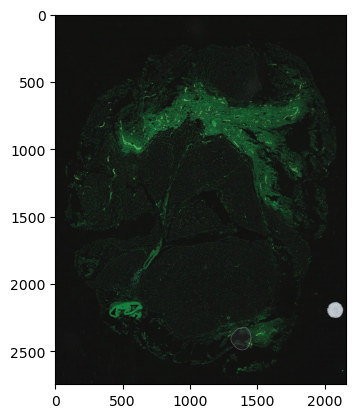

In [93]:
plt.imshow(f1)

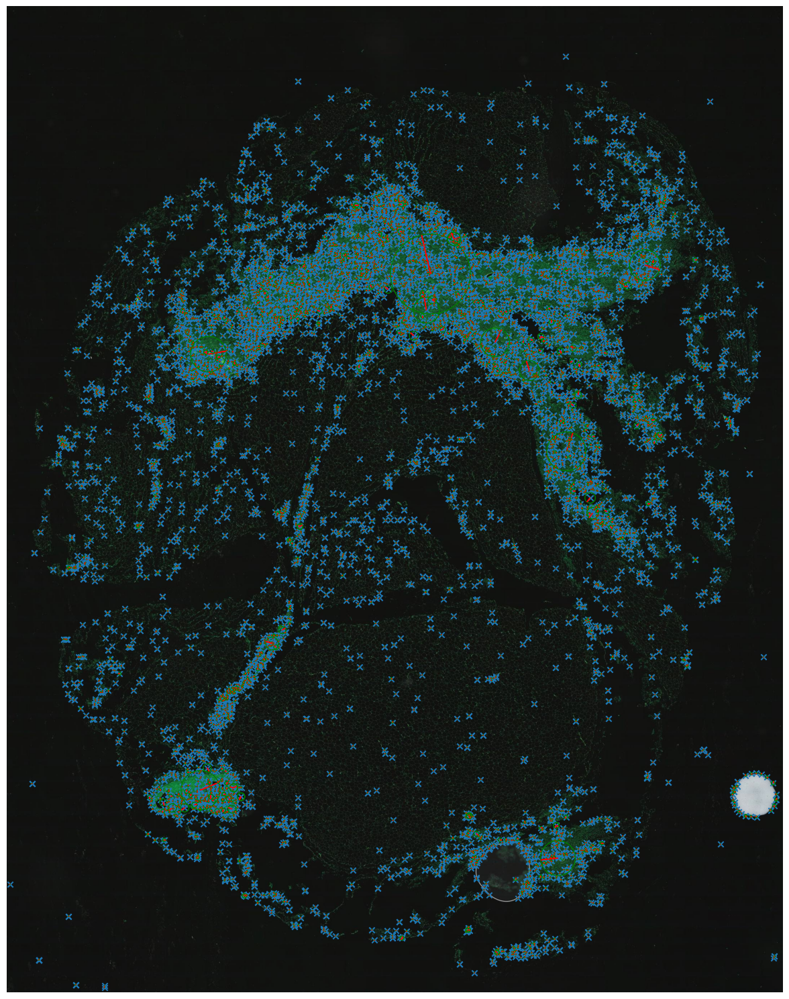

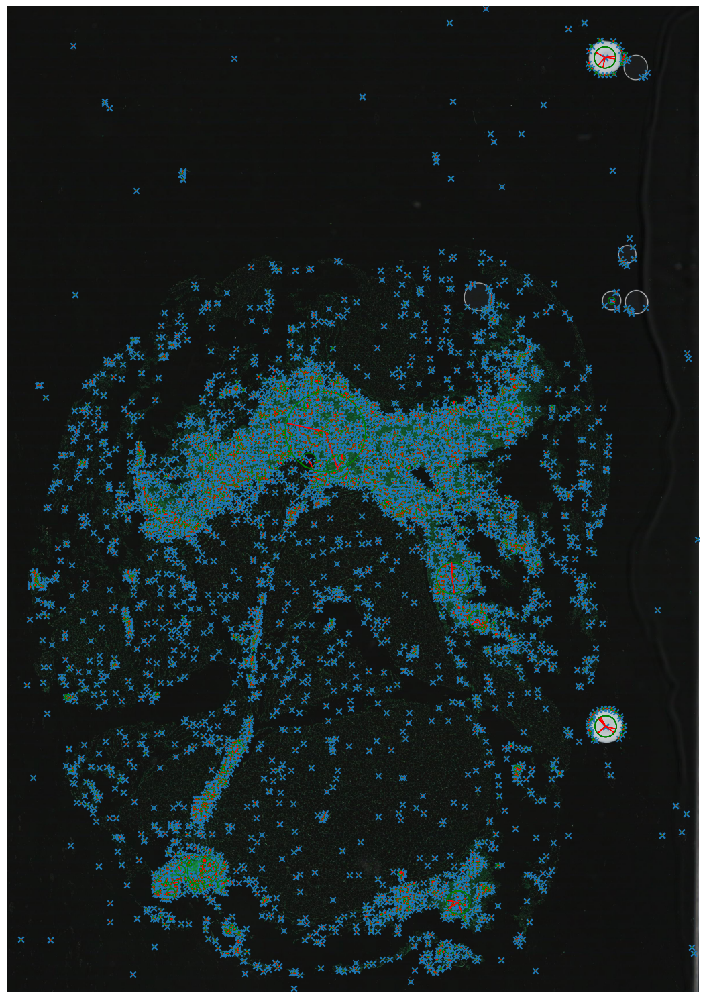

In [94]:
fd = cv2.SIFT_create()
kp1, d1 = fd.detectAndCompute(f1[:,:,::-1], None)
kp2, d2 = fd.detectAndCompute(f2[:,:,::-1], None)
plt.figure(figsize=(15,15))
plt.imshow(f1)
draw_keypoints(kp1)
plt.axis('off')
plt.tight_layout()
plt.figure(figsize=(15,15))
plt.imshow(f2)
draw_keypoints(kp2)
plt.axis('off')
plt.tight_layout()

## Matching Descriptors

Now that you have computed the SIFT descriptors, you can use those to establish possible matches. Matching points (one keypoint in image 1 and one in image 2) are based on the similarity of the descriptors. So a keypoint 
$(x,y,s,\theta, \v d)$ in image 1 and a keypoint $(x',y',s',\theta',\v d')$ in image 2 are considered a match in case $\|\v d-\v d'\|$ is small.

We will use the 'brute force matcher' from OpenCV. It is a greedy algorithm: select the pair of keypoints, one from image 1 and one from image 2, with the minimal descriptor distance. This is the first match and these keypoints will not be considered again. Then you repeat the search and so on and so on, until you run out of descriptors in one of the two images.


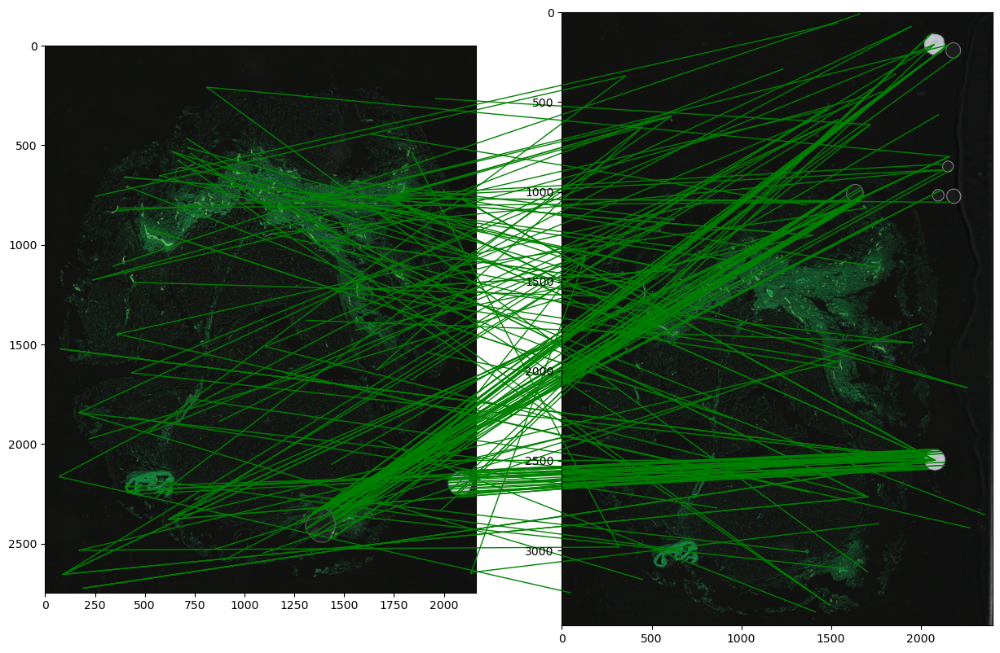

In [95]:
matcher = cv2.BFMatcher()
matches = matcher.match(d1,d2)
matches = sorted(matches, key = lambda x: x.distance)

draw_matches(f1, kp1, f2, kp2, matches[:200], figsize=(15,15), horizontal=True)

Observe that you see a lot of 'wrong' matches in the above images. But are they really wrong? What is happening? Why do we find these 'wrong' matches? And what do we mean with 'wrong' really? 

These 'wrong' matches will be filtered out in the next section. The filtering will *not* be done based on visual appearance but on the possibility to find a common mapping of points in image 1 to the corresponding points in image 2.

In case you are interested in algorithms and datastructures it might be interesting to realize that such a brute force approach to matching (essentially the problem of finding closest points in high dimensional space, in our case $\v d\in\setR^{256}$) is rather slow. It turns out that a faster search for the closest point is not trivial. In OpenCV an *approximate* but faster algorithm is available.

## Random Sample Concensus (RANSAC)

RANSAC is a method to simulatenously estimate the parameters of a transformation given examples of (input, output) pairs while at the same time removing those pairs that are not related by the model (the *outliers*).

The RANSAC algorithm needs two functions ``fit_model`` and ``test_model`` and proceeds as follows:

1. The ``fit_model`` function takes a randomly selected list of ``n_model_data`` (input, output) pairs and estimates the parameters of the model, so that the model maps each of the inputs as close as possible to the corresponding outputs. Most often ``n_model_data`` is taken to be the minimum number of (input, output) pairs that allow the parameters to be calculated.

1. The ``test_model`` function tests a given model on all available (input, output) pairs. It selects those pairs that fit the model quite good (a threshold to be set by the programmer, depending on what model is being used) as the *inliers*.

1. The functions ``fit_model`` and ``test_model`` are called ``n_iter`` times each time with a random choice of ``n_model_data`` (input, output) pairs. The model with the most inliers is taken to be the optimal model.

1. Finally, the model parameters are then estimated once more, not with just the ``n_model_data`` pairs, but with all inliers for this model.

Read about the RANSAC algorithm (e.g. on Wikipedia) and complete the ``ransac`` function below. To see the ``ransac`` function in action (if you have completed the code, or when you are looking for an example in what way to write the ``fit_model`` and ``test_model`` function look at the subsequent section on line fitting with RANSAC.

Your RANSAC solution should be reasonably fast: the test cell below should run within a few seconds. One of the codegrade tests will call the function repeatedly to test both its speed and correctness.

Note that RANSAC is agnostic about the model type used, as long as it is consistent between the data and the functions `fit_model` and `test_model`. This allows us to write it once and use it on a variety of problems: in this notebook, line fitting and image alignment.

In [96]:
import random as random
def ransac(data, fit_model, test_model, test_model_pars, 
           n_model_data, n_iter):
    """
    Use of RANSAC to fit a model to data
    
    Parameters
    ==========
    
    data: list
       each item in data is a tuple (input, output)
    fit_model: callable
       a function that takes data (a list of tuples of 
       (input, output) pairs) and returns an object describing 
       the fitted model
    test_model: callable
       a function that takes as first parameter the model 
       (return value of fit_model) and as second argument a list
       of (input, output) tuples (it expects all data tuples 
       including those used for the estimation). 
       It returns an array with the indices in the list of tuples 
       (second parameter) of all data tuples that fit the model 
       (i.e. the inliers)
    test_model_pars: dict
       a dictionary that is passed to the ``test_model`` function used to set
       a threshold to determine if an (input, output) pair is an inlier or not.
    n_model_data: int
       the number of data tuples to be used to fit the model
    n_iter: int
       number of iterations 
    
    
    Return Value
    ============
    (model, inliers): tuple
       model: the model, as returned by fit_model
       inliers: the indices of the inliers of the returned model 
           (not just the data points used to fit the model)
    """
    
    best_model = None
    best_inliers = []
    for _ in range(n_iter):
        model = fit_model(random.sample(data, n_model_data))
        indi = np.array(test_model(model, data, **test_model_pars))

        if len(indi) > len(best_inliers):
            best_model = fit_model(np.array(data)[indi])
            best_inliers = indi

    return best_model, best_inliers


### Ransac for Line Fitting

Let's try the RANSAC algorithm on the line fitting problem. Note: fitting a line is NOT what is needed in the image stitching problem! We start with it because it is an easier problem and more easily visualized. 

First we generate some noisy data. We generate random  𝑥  values in the range from 0 to 10. The majority of those  𝑥  values get an  𝑦  value (to generate the pair  (𝑥,𝑦) ) that is on a straight line but with a random error. The remaining  𝑥  values are given a random  𝑦 -value.

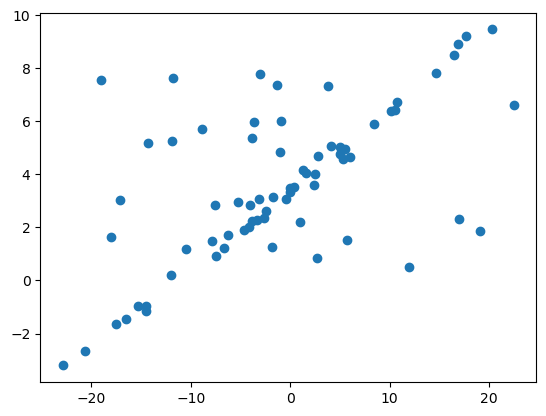

In [97]:
np.random.seed(7)
x = 10 * np.random.randn(70)
y = 0.3 * x + 3.4
y = y + 0.3 * np.random.randn(len(y))
y[40:] = 8 * np.random.rand(30)
plt.plot(x,y,'o')
data = list(zip(x,y)) # a list of pairs (input,output), 
                      # in this case (x,y) pairs

Given a number of $n>2$ pairs of points $(x,y)$ we can fit a line using a LSQ procedure:

In [98]:
def fit_line(data):
    """Fit a line to (x,y) pairs using a LSQ procedure"""
    X = np.array( [ [a, 1] for (a,b) in data])
    y = np.array( [ b for (a,b) in data])
    return np.linalg.lstsq(X, y, rcond=None)[0]

Text(0.5, 1.0, 'LSQ fit')

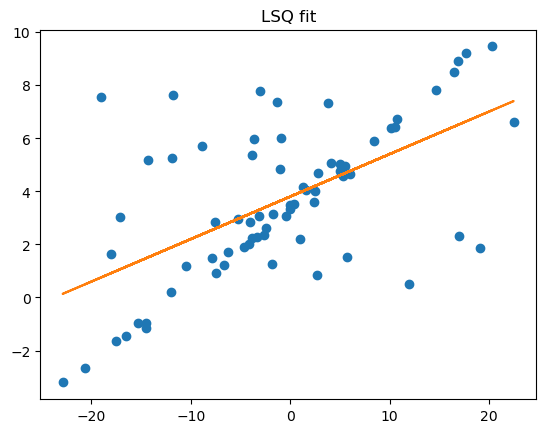

In [99]:
line_lsq = fit_line(data)
yfit_lsq = line_lsq[0]*x + line_lsq[1]
plt.plot(x,y,'o')
plt.plot(x,yfit_lsq)
plt.title('LSQ fit')

Evidently this is not the line we are looking for. We need to get rid of the outliers, i.e. the points $(x,y)$  that are not from the straight line. With the ``test_line`` function we can find the inliers for a given model.

In [100]:
def test_line(line, data, max_error=1):
    x = np.array( [ x for x, _ in data])
    y = np.array( [ y for _, y in data])
    yp = line[0]*x + line[1]
    err = np.abs(y-yp)
    inliers_idx = np.flatnonzero(err<max_error)
    return inliers_idx

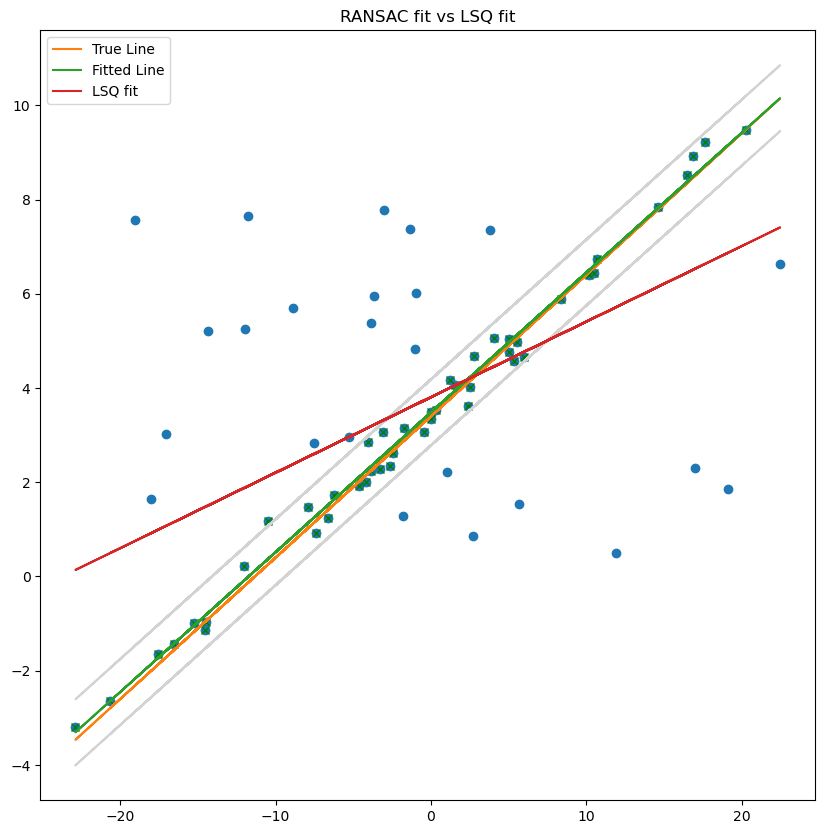

In [101]:
# Visual test (for the first test case below)

plt.figure(figsize=(10,10))
me = 0.7
line = None
inliers_idx = None
line, inliers_idx = ransac(data, fit_line, test_line, 
                           {'max_error':me}, 4, 1000)
plt.plot(x, y, 'o')
plt.plot(x[inliers_idx], y[inliers_idx], 'gx')
yfit = line[0]*x + line[1]
plt.plot(x, 0.3 * x + 3.4, label='True Line')
plt.plot(x,yfit, label='Fitted Line')
plt.plot(x,yfit+me, 'lightgray')
plt.plot(x,yfit-me, 'lightgray')
plt.plot(x,yfit_lsq, label='LSQ fit')
plt.legend()
plt.title('RANSAC fit vs LSQ fit');

### Find a Perspective Transform using Ransac

Remember where we are in the stitching process? We have found keypoints in the first and second image, collected in arrays ``kp1`` and ``kp2``. The matching pairs are encoded in the ``matches`` datastructure. First we are going to make a ``data`` list where each entry is of the form ``((x1, y1), (x2, y2))`` that is a tuple of two tuples encoding the position of matching keypoint coordinates in the first and second image.

In [102]:
data = [((kp1[m.queryIdx].pt), (kp2[m.trainIdx].pt)) for m in matches]

Next we need a ``fit_model`` and ``test_model`` function in order to use Ransac. You have already defined ``projective_fit_model`` which takes a set of point correspondences and finds the best projective matrix ``P`` that maps points (x1, y1) to (x2, y2). Now define `projective_test_model`.

In [103]:
def projective_test_model(P, data, max_error=2):
   indices = []
   for i, (input, output) in enumerate(data):
      multi = P @ np.append(input, 1)
      new = multi[:2]/multi[2]
      if np.linalg.norm(new - output) < max_error:
         indices.append(i)
   return indices


In [104]:
# You can use the assert statements in this cell to locally test your projective_test_model.
# There will be other tests in the codegrade autograding.

x = np.array([[-0.30099881,  0.34786734],
       [-0.43573294,  0.64231348],
       [-1.28532622,  1.13860487],
       [ 0.54744592,  0.51493255],
       [-0.20087976,  0.18980669],
       [-1.27066563, -0.20241131],
       [-0.64972417, -2.02646797],
       [-2.38189517, -0.1663487 ]])
xa = np.array([[ 0.369618  ,  0.67714101],
       [ 1.72259747, -0.04050429],
       [ 2.22190863, -1.06356781],
       [ 0.80900945, -2.48119838],
       [-0.53911635,  1.2555933 ],
       [ 0.07221467, -0.24165753],
       [-2.37579957,  0.87320773],
       [ 0.47265383, -0.59226317]])
P = np.array([[ 1.        , -1.8574528 ,  0.77686397],
                [-1.0861612 ,  0.63049228, -0.85821791],
                [ 1.01049866,  0.34736811, -0.27737639]])
assert np.array_equal(projective_test_model(P, list(zip(x, xa))), np.arange(8))
xa[::2, 0] += 1
xa[::4, 0] += 1
xa[::3, 1] += 1
xa[1::3, 1] += 1
assert np.array_equal(projective_test_model(P, list(zip(x, xa)), 0.5), np.array([5]))
assert np.array_equal(projective_test_model(P, list(zip(x, xa)), 1.1), np.array([1, 2, 3, 5, 7]))
assert np.array_equal(projective_test_model(P, list(zip(x, xa)), 2), np.array([1, 2, 3, 5, 6, 7]))
assert np.array_equal(projective_test_model(P, list(zip(x, xa)), 3), np.arange(8))

[[-2.25603429e+13 -1.24129543e+13  6.74265942e+16]
 [-4.38395720e+13 -1.03664966e+13  1.04694720e+17]
 [ 1.96244479e+10  1.05786726e+10 -5.82329542e+13]]


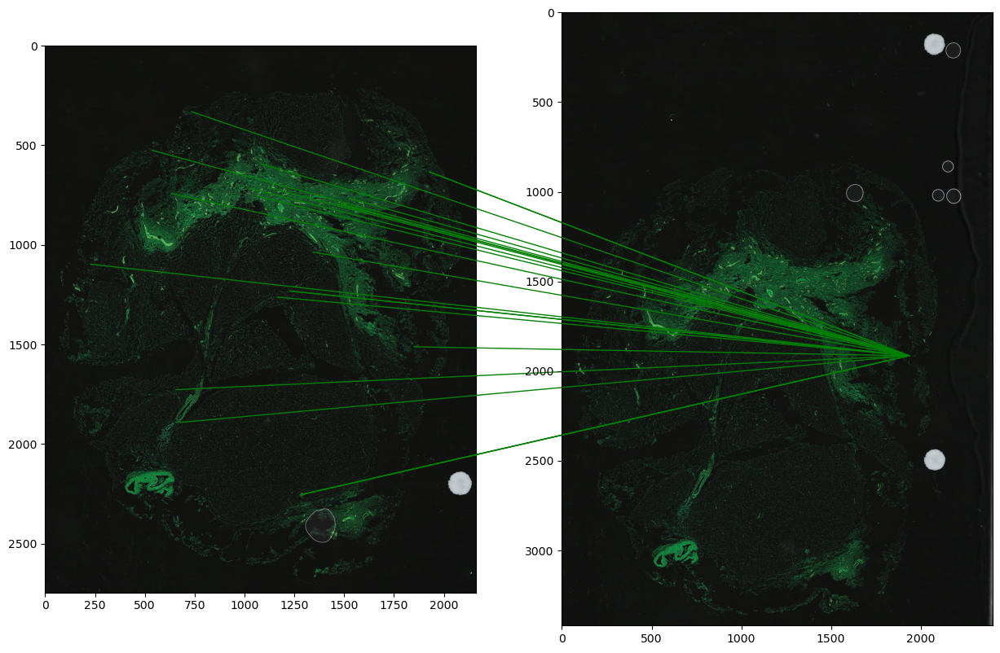

In [105]:
P, inliers = ransac(data, projective_fit_model, 
                    projective_test_model, {'max_error':1}, 4, 1000) 
print(np.linalg.inv(P))
draw_matches(f1, kp1, f2, kp2, np.array(matches)[inliers], 
             horizontal=True)

## Stitching it all together

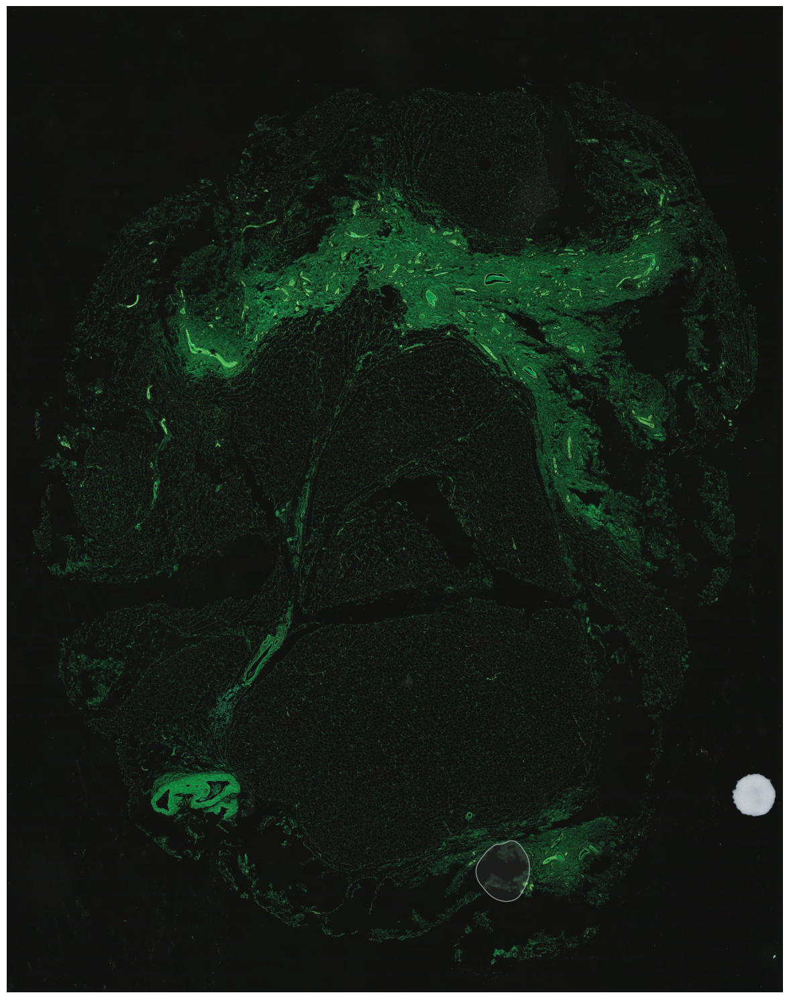

In [106]:
plt.figure(figsize=(15,15))
f_stitched = warp(f2, P, output_shape=(2745,2160), preserve_range=True).astype(np.uint8)
M, N = f1.shape[:2]
f_stitched[:M, :N, :] = f1
plt.imshow(f_stitched)
plt.axis('off')
plt.tight_layout()

## A Better Stitch (Bonus Points)

Stitching the images was done by

1. warping the f2 image onto the coordinate frame of the first image (using a larger image than f1 to fit the second one)

1. copying the first image to this larger image (as the top left content)

This was all done by trial and error. But as you can see some parts of the second image are not visible in the resulting larger image.



Your task now is to define an image in which both images fit entirely. From the image above we see that we need some more spave at the top and bottom. The easiest way (for me) is to calculate the bounding box of the transformed second image (i.e. based on the coordinates of the 4 corners of the second image with respect to the coordinate frame of the first image). Use your knowledge of coordinate transforms and homogeneous transforms (you need a translation matrix...).

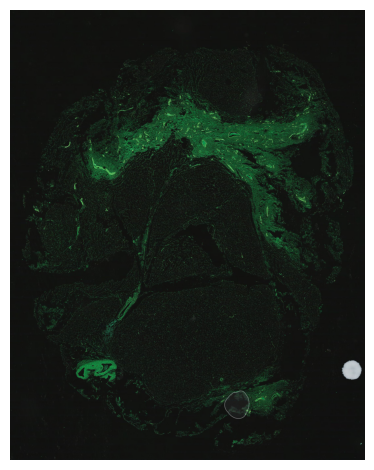

In [107]:
T = np.array([[1,0,-1/2], [0,1,0], [0,0,1]])
new_st = warp(f2, np.matmul(P, T), output_shape=(2745,2160), preserve_range=True).astype(np.uint8)
M, N = f1.shape[:2]
new_st[:M, :N, :] = f1
plt.imshow(new_st)
plt.axis('off')
plt.tight_layout()

## Stitching your own Images (Bonus Points)

We challenge you to take a few pictures of the same scene that do overlap and try to stitch them together in one large image.

1. Start with two images! Be aware that not all two images from the same scene can be stitched together. As a rule of thumb: take pictures of an almost flat surface (like the Nachtwacht or a flat facade of a building, or pictures of a poster on your wall) or take pictures while keeping your camera at one spot and only rotating the camera (like taking a picture of a mountain view at a distance far from the mountains). (2pt)

1. Then try three images. Start with the a priori knowledge that f1 can be stitched with f2 and f2 with f3. (1pt)

1. If you are really brave, try 5 or 6 images. The record for this class is 5 images... (no points but a lot of bragging rights)

When using real life images you undoubtly encounter the need for color correction. The images used in stitching do not show the same colors at corresponding points (due to lighting mostly). Color correction is nice subject that we don't have the time to deal with in these lecture series, so in particular it is not part of this bonus assignment.


### Using your own images

Note, when doing an assignment with your own images, you have to upload those along with the notebook!

In [108]:
f1 = cv2.normalize(plt.imread('memory_1.png'), None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
f2 = cv2.normalize(plt.imread('memory_2.png'), None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
f3 = cv2.normalize(plt.imread('memory_3.png'), None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

FileNotFoundError: [Errno 2] No such file or directory: 'memory_1.png'

In [ ]:
fd = cv2.SIFT_create()
kp1, d1 = fd.detectAndCompute(f1[:,:,::-1], None)
kp2, d2 = fd.detectAndCompute(f2[:,:,::-1], None)

matcher = cv2.BFMatcher()
matches = matcher.match(d1,d2)
matches = sorted(matches, key = lambda x: x.distance)

data = [((kp1[m.queryIdx].pt), (kp2[m.trainIdx].pt)) for m in matches]

In [ ]:
P, inliers = ransac(data, projective_fit_model, 
                    projective_test_model, {'max_error':1}, 4, 1000) 

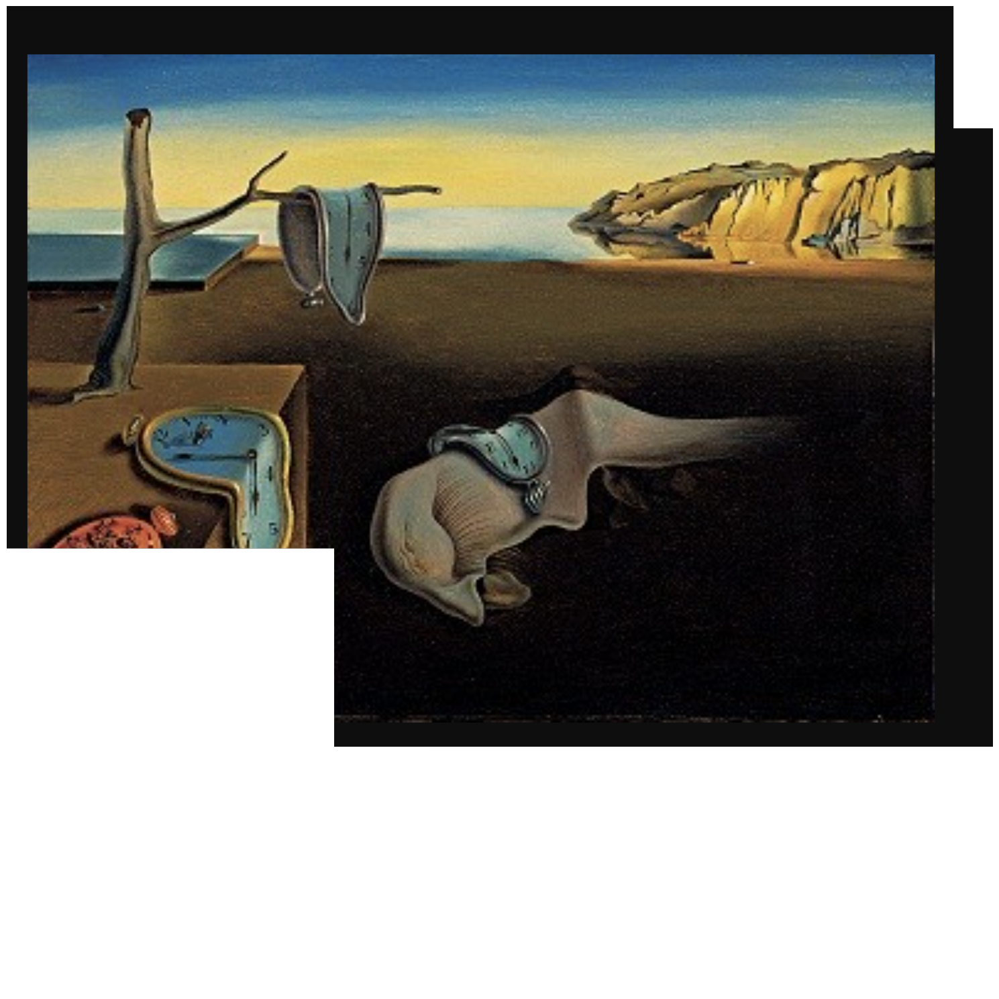

In [ ]:
plt.figure(figsize=(15,15))
f4 = warp(f2, P, output_shape=(2000,2000), preserve_range=True).astype(np.uint8)
M, N = f1.shape[:2]
M2, N2 = f2.shape[:2]
f4[:M, :N, :] = f1
plt.imshow(f4)
plt.axis('off')
plt.tight_layout()

In [ ]:
fd = cv2.SIFT_create()
kp3, d3 = fd.detectAndCompute(f3[:,:,::-1], None)
kp4, d4 = fd.detectAndCompute(f4[:,:,::-1], None)

matcher = cv2.BFMatcher()
matches = matcher.match(d3,d4)
matches = sorted(matches, key = lambda x: x.distance)

data = [((kp3[m.queryIdx].pt), (kp4[m.trainIdx].pt)) for m in matches]

In [ ]:
P, inliers = ransac(data, projective_fit_model, 
                    projective_test_model, {'max_error':1}, 4, 1000)

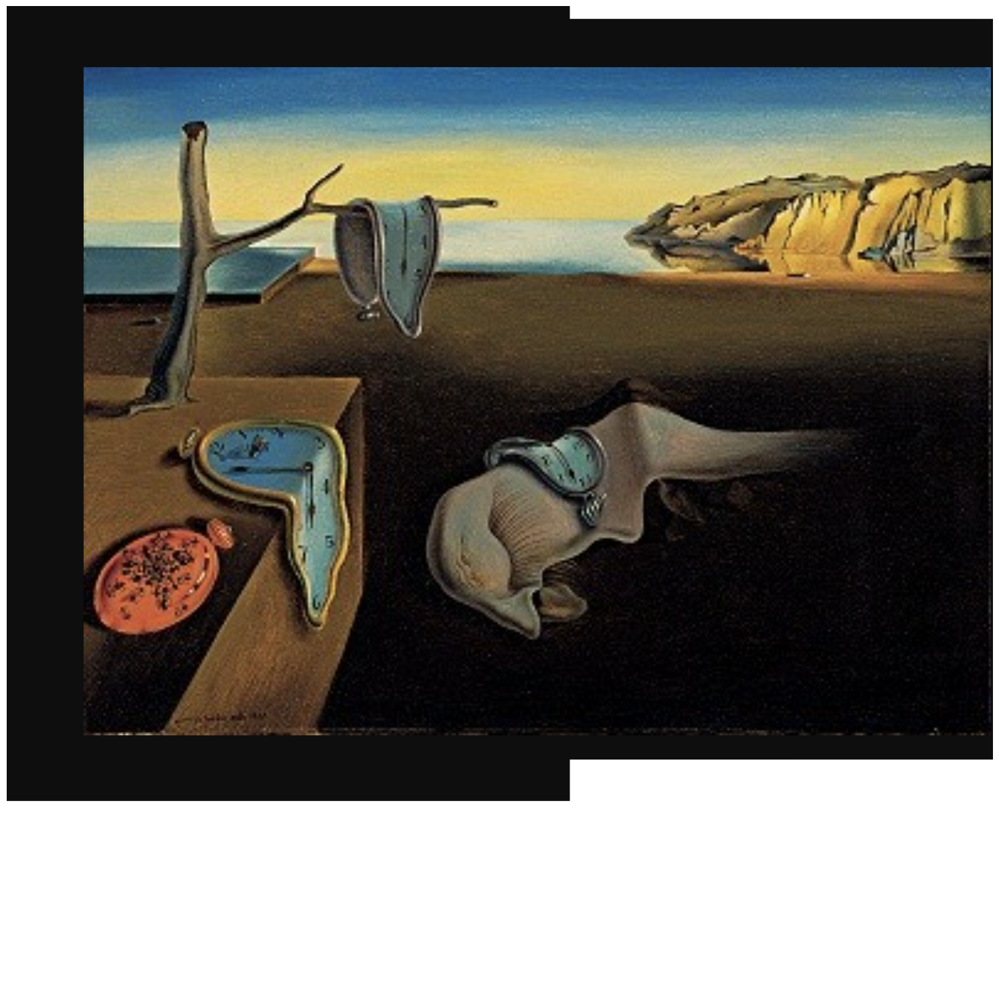

In [ ]:
plt.figure(figsize=(15,15))
fst = warp(f4, P, output_shape=(2000,2000), preserve_range=True).astype(np.uint8)
M, N = f3.shape[:2]
fst[:M, :N, :] = f3
plt.imshow(fst)
plt.axis('off')
plt.tight_layout()